
 # Фильтрация шумов на фотографиях
 ## Итоговый проект по курсу информатики студентов 3 курса ФБМФ
 ### Чикин Олег и Казакова Анастасия, группа 6111

Среди предложенных тем нас больше всего заинтересовало графическое приложение информатики к обработке фотографий. Поэтому мы решили подробнее изучить возможности библиотеки matplotlib, а конкретно фильтрацию шумов на фотографиях с помощью функций этой библиотеки.

Мы выбрали несколько изображений для демонстрации работы нашего проекта.

______________
Matplotlib позволяет не только отображать двумерные массивы, но и загружать их в виде массивов NumPy. Загрузим изображение в `numpy.array` и посмотрим на размер полученного массива чисел.

In [97]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

image = plt.imread('../Chehiya.jpg')
# image.shape

In [99]:
image.shape

(1077, 808, 3)

Из-за того что для обозначения цвета пикселя используется модель RGB наш массив не двумерный, а трехмерный: высота - 1077 пикселей, ширина - 808 пикселей, и три числа для уровней красного, зеленого и голубого. В модели RGBA каждый пиксель будет задан четырьмя числами, где четвертое число - уровень прозрачности. Если каждый цвет пикселя задан в оттенках серого, то массив будет двумерным, так как для уровня серого достаточно одного числа.Теперь напечатаем зашумленное изображение.Кстати говоря, это мы с Олегом в Чехии:)

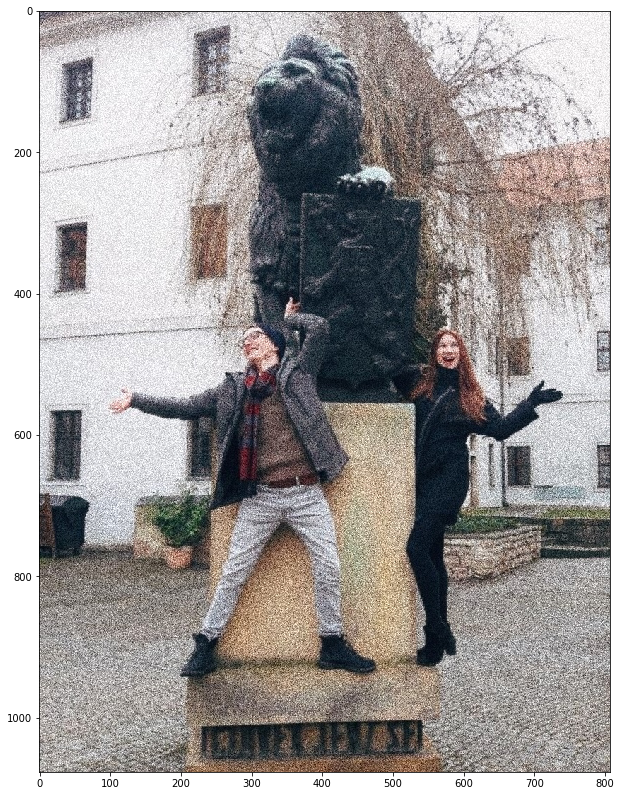

In [98]:
plt.figure(figsize=(21, 14))
plt.imshow(image);

Как видим, изображение достаточно зашумленное. Наша задача -- избавиться от шума . 

 ## Природа шума

Пусть $X = \left(x_{ijk}, i=1...H, j=1...W, k\in\{1,2,3\}\right)$ -- исходное изображение, а $\varepsilon = \left(\varepsilon_{ijk}, i=1...H, j=1...W, k\in\{1,2,3\}\right)$ -- шум, являющийся набором независимых случайных величин. Тогда зашумленное изображение $Y = \left(y_{ijk}, i=1...H, j=1...W, k\in\{1,2,3\}\right)$ определяется как
$$y_{ijk} = 
\begin{cases}
\lfloor x_{ijk} + \varepsilon_{ijk} \rfloor, если\ 0 < x_{ijk} + \varepsilon_{ijk} < 255; \\ 
0, если\ x_{ijk} + \varepsilon_{ijk} \leqslant 0; \\
255, если\ x_{ijk} + \varepsilon_{ijk} \geqslant 255. \\
\end{cases}$$

Более того, $\mathsf{P}\left(\varepsilon_{ijk} = 0\right) > 0$, то есть зашумляется не каждый пиксель.

Зашумленное изображение - $Y$, а исходное изображение $X$ и шум $\varepsilon$ нам неизвестны. Построим на основе изображения $Y$  изображение $Z = \left(z_{ijk}, i=1...H, j=1...W, k\in\{1,2,3\}\right)$ минимизируя среднеквадратичное отклонение по цветам пикселей, определяемое как
$$MSE = \frac{1}{3HW} \sum_{i=1}^H \sum_{j=1}^W \sum_{k=1}^3 \left(x_{ijk} - z_{ijk}\right)^2$$


Восстановление каждого пикселя может быть произведено на основе следующих статистик, посчитанных по окрестности каждого пикселя одного цветового канала:
* среднее;
* усеченное среднее;
* медиана;
* медиана средних Уолша;
* оценка Питмена;
* взвешенное среднее;
* другие матричные фильтры (см. https://habr.com/post/142818/).

In [91]:
!pip install tqdm

In [154]:
"""Все используемые функции:"""

"""1) Медиана по направлениям (фильтр размера 3 на 3):
Считает медиану по среднему столбцу, по средней строке и по диагоналям.
Далее считает медиану из центра, медианы столбца и медианы строки.
Далее считает медиану из центра и медиан диагоналей.
В итоге записывает в центральную клетку медиану из центра и  двух прошлых медиан."""
def top_av_3 (part):
    M1 = np.median(part[1])
    M2 = np.median(np.transpose(part)[1])
    M3 = np.median([part[0][0], part[1][1], part[2][2]])
    M4 = np.median([part[0][2], part[1][1], part[2][0]])
    Ma = np.median([part[1][1], M1, M2])
    Mb = np.median([part[1][1], M3, M4])
    return np.median([part[1][1], Ma, Mb])

"""2)Медиана по направлениям (фильтр размера 5 на 5):
Повторяет алгоритм аналгочный прошлому но для фильтра размером 5 на 5."""
def top_av_5 (part):
    M1 = np.median(part[2])
    M2 = np.median(part[0:5, 2])
    M3 = np.median([part[0][0], part[1][1], part[2][2], part[3][3], part[4][4]])
    M4 = np.median([part[0][4], part[1][3], part[2][2], part[3][1], part[4][0]])
    Ma = np.median([part[2][2], M1, M2])
    Mb = np.median([part[2][2], M3, M4])
    return np.median([part[2][2], Ma, Mb])

"""3)Обычная медиана (фильтр 3 на 3):
Сортирует все элементы массива и записывает в центральную клетку медиану."""
def top_sort_3 (part):
    string_part = part[0]
    for i in range(1, 3):
        string_part = np.concatenate((string_part, part[i]), axis=0)
    return np.median(np.sort(string_part))

"""4)Сглаживание (фильтр 5 на 5):
Матричный фильтр который домножает часть картинки на матрицу T полементно 
и в центральную клетку записывает сумму.
Матрица Т сосотоит из чесел распределенных по Гауссовскому закону и 
нормированных.
"""
def vave (part):
    fltr=np.asarray([[0.000789, 0.006581, 0.013347, 0.006581, 0.000789],\
                     [0.006581, 0.054901, 0.111345, 0.054901, 0.006581],\
                     [0.013347, 0.111345, 0.225821, 0.111345, 0.013347],\
                     [0.006581, 0.054901, 0.111345, 0.054901, 0.006581],\
                     [0.000789, 0.006581, 0.013347, 0.006581, 0.000789]])
    return np.sum(part*fltr)

"""5)Добавление рамки:
Функция добавляет рамки фотографии шириной в 1 пиксель, которые полностью 
совпадают
\с границами фоторафии. (Получается, что вокруг каждой угловой клетки фотографии, 
стоит еще по 3 таких же)"""
def lim(image):
    ans = np.zeros((len(image)+2, len(image[0])+2, len(image[0][0])))
    ans = ans.astype(np.uint8)
    
    ans[1:len(image)+1, 1:len(image[0])+1, 0:len(image[0][0])] = image
    
    ans[0, 1:len(image[0])+1] = image[0]
    ans[len(image)+1, 1:len(image[0])+1] = image[len(image)-1]
    
    ans[1:len(image)+1, 0] = image[0:len(image), 0]
    ans[1:len(image)+1, len(image[0])+1] = image[0:len(image), len(image[0])-1]

    ans[0][0] = image[0][0]
    ans[len(image)+1][0] = image[len(image)-1][0]
    ans[len(image)+1][len(image[0])+1] = image[len(image)-1][len(image[0])-1]
    ans[0][len(image[0])+1] = image[0][len(image[0])-1]
    
    return ans

"""5)Функция запуска фильтра: 
Эта функция принимает на вход картинку - img,
каким способом фильтровать - fltr,
размеры фильтра - filtr_size,
уровни на которых производить фильтрацию level_1 - начальный, level_2 - конечный."""
from tqdm import tqdm_notebook
def run(img, fltr, filtr_size, level_1, level_2):
    image = np.copy(img)
    x = int((filtr_size-1)/2)
    for i in tqdm_notebook(range(x, len(img)-x)):
        for j in range(x, len(img[0])-x):
            for k in range(level_1, level_2):
                part = image[i-x:i+x+1,\
                             j-x:j+x+1, k]
                image[i][j][k] = fltr(part)
    return image

"""В решении ниже все фильтрации проходят сразу на 3 уровнях."""

'В решении ниже все фильтрации проходят сразу на 3 уровнях.'

**Денойзинг нас в Чехии**

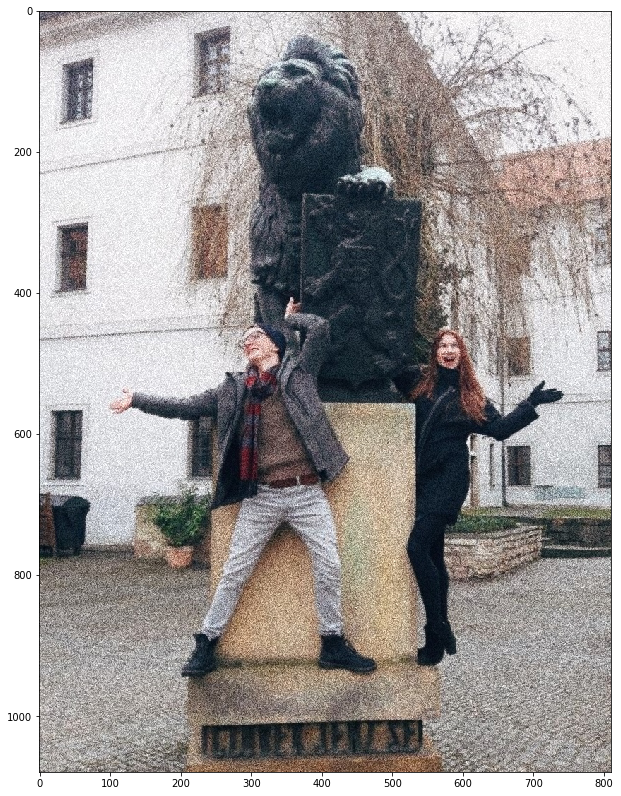

In [100]:
"""Сначала добавляем рамку для более качественной фильтрации и используем
медиану по направлениям для фильтра 3 на 3."""

av_3_lim = run(lim(image), top_av_3, 3, 0, 3)

plt.figure(figsize=(21, 14))
plt.imshow(av_3_lim);

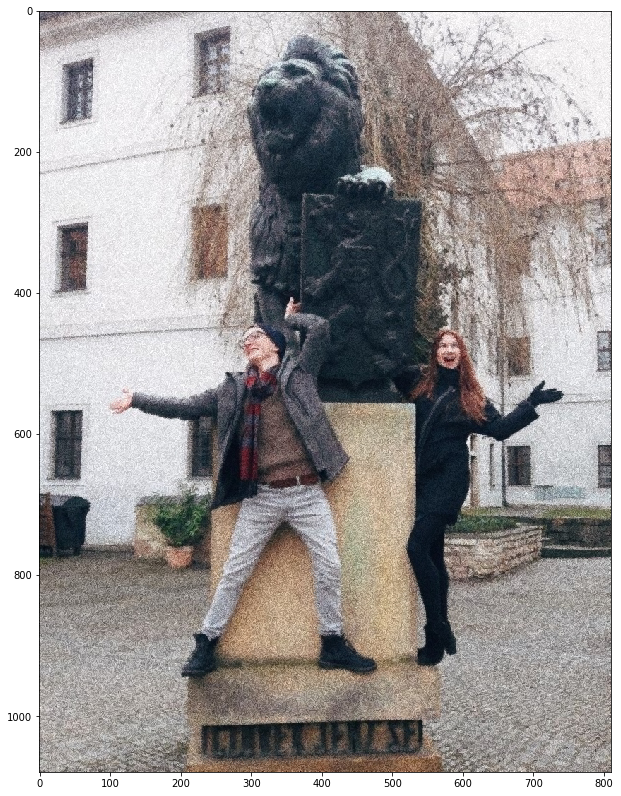

In [101]:
"""Далее используем медиану по направлениям для фильтра 5 на 5."""

av_5_3_lim = run(av_3_lim, top_av_5, 5, 0, 3)

plt.figure(figsize=(21, 14))
plt.imshow(av_5_3_lim);

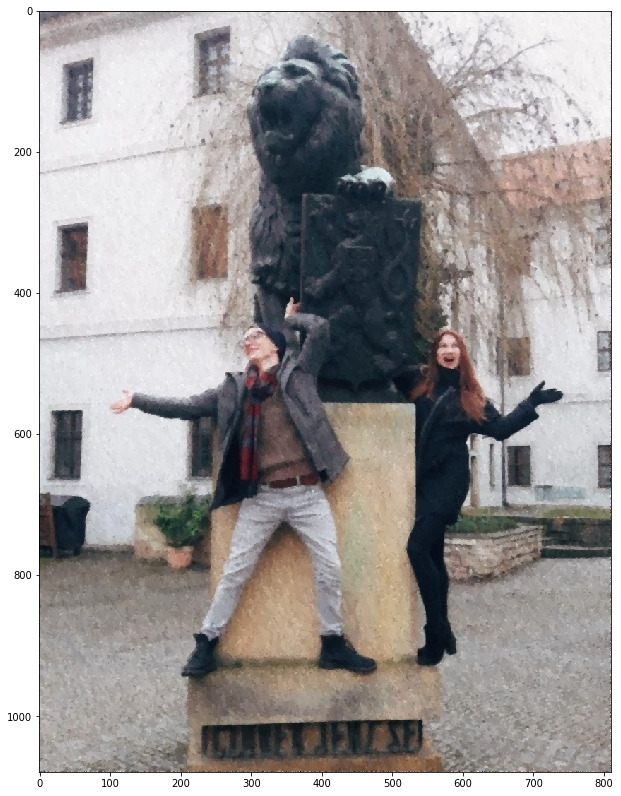

In [102]:
"""Далее используем обычную медиану."""

sort_av_5_3_lim = run(av_5_3_lim, top_sort_3, 3, 0, 3)

plt.figure(figsize=(21, 14))
plt.imshow(sort_av_5_3_lim);

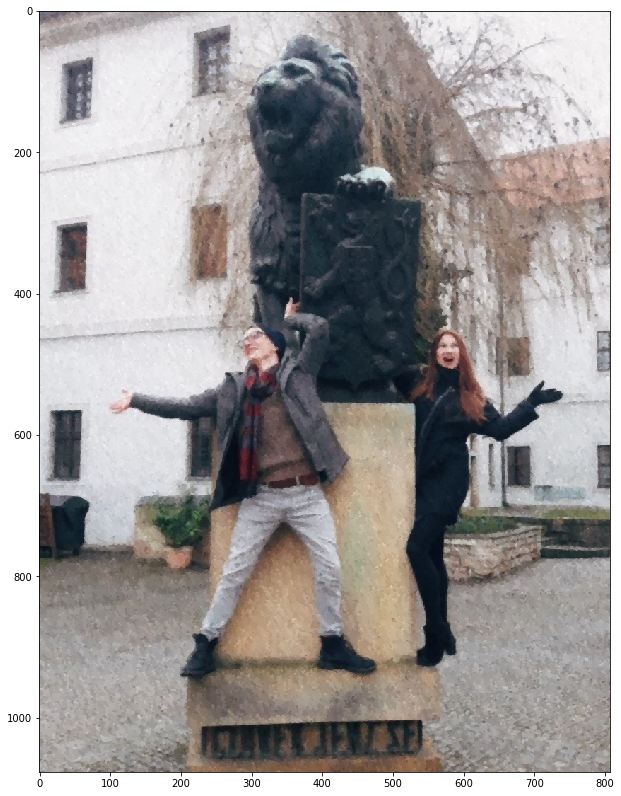

In [137]:
"""Снимаем рамки, получаем итоговый результат."""

sort_av_5_3 = sort_av_5_3_lim[1:1078, 1:809, 0:3]

plt.figure(figsize=(21, 14))
plt.imshow(sort_av_5_3);

**Денойзинг Олега**

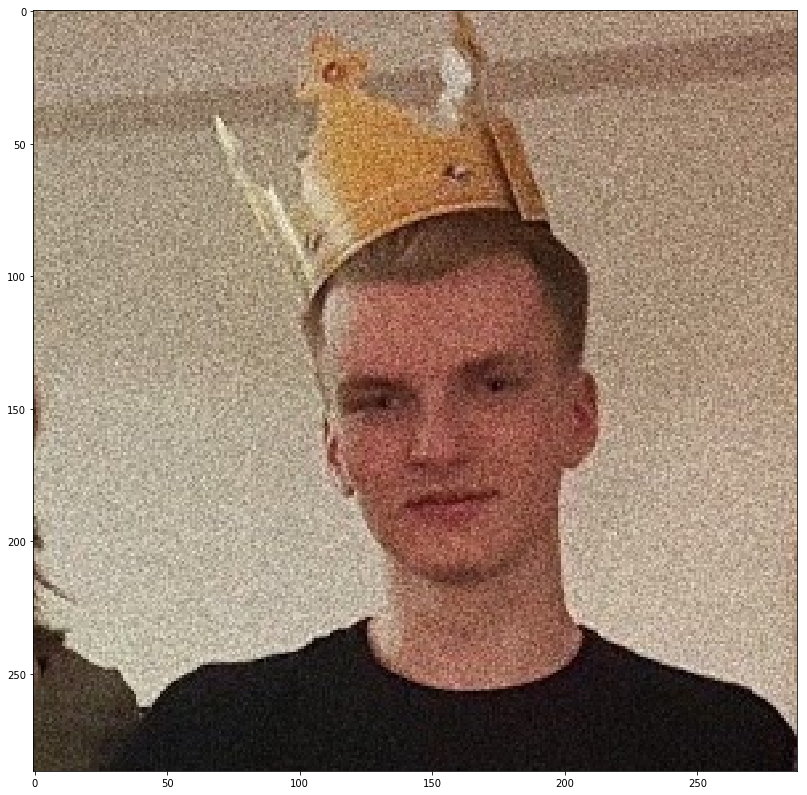

In [142]:
image = plt.imread('../Burger.jpg')

plt.figure(figsize=(21, 14))
plt.imshow(image);


In [143]:
image.shape

(287, 288, 3)

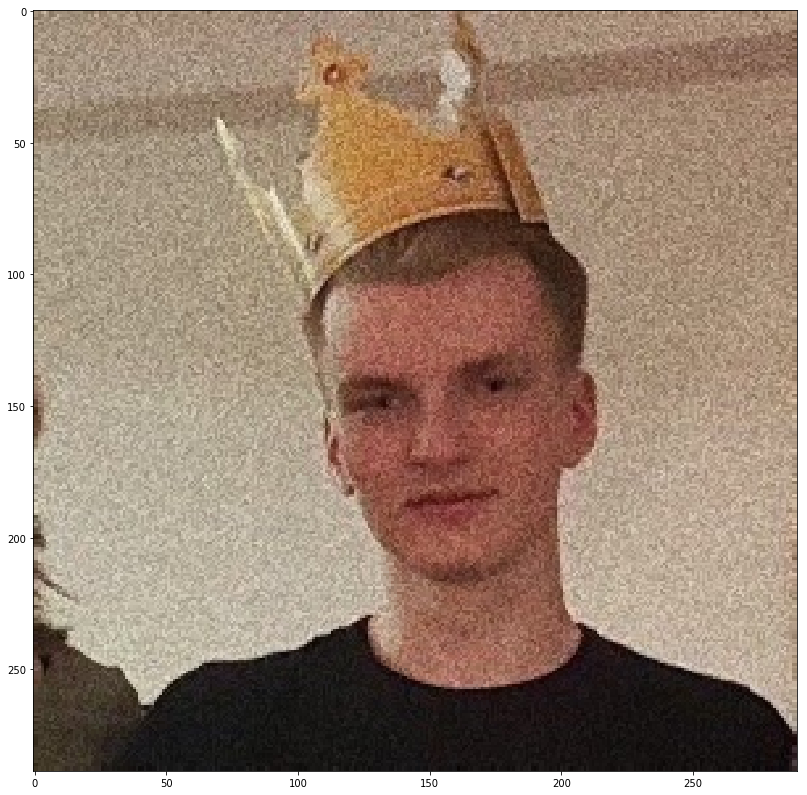

In [144]:
"""Сначала добавляем рамку для более качественной фильтрации и используем
медиану по направлениям для фильтра 3 на 3."""

av_3_lim = run(lim(image), top_av_3, 3, 0, 3)

plt.figure(figsize=(21, 14))
plt.imshow(av_3_lim);

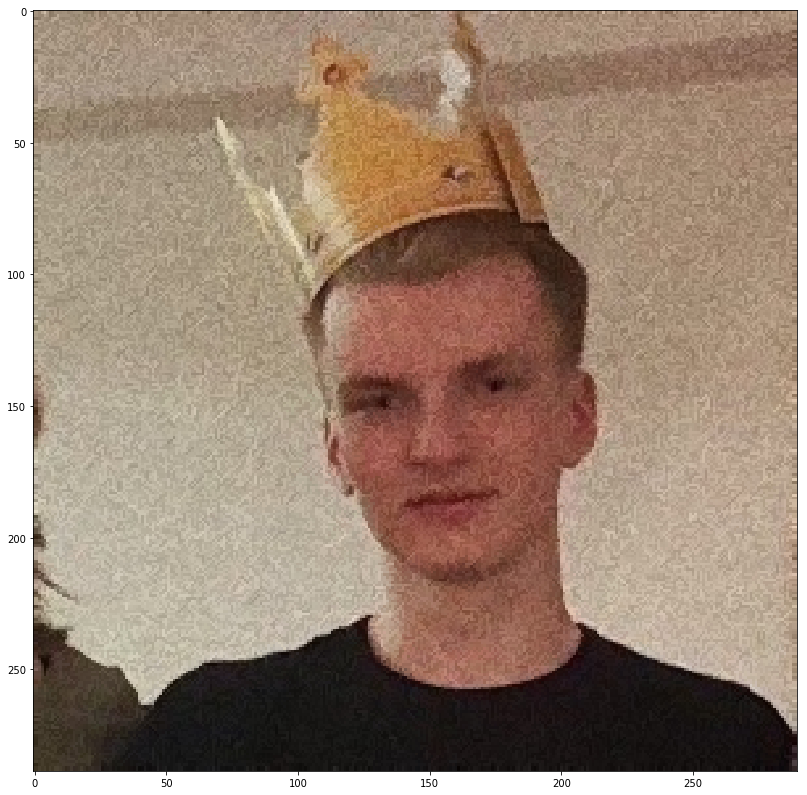

In [145]:
"""Далее используем медиану по направлениям для фильтра 5 на 5."""

av_5_3_lim = run(av_3_lim, top_av_5, 5, 0, 3)

plt.figure(figsize=(21, 14))
plt.imshow(av_5_3_lim);

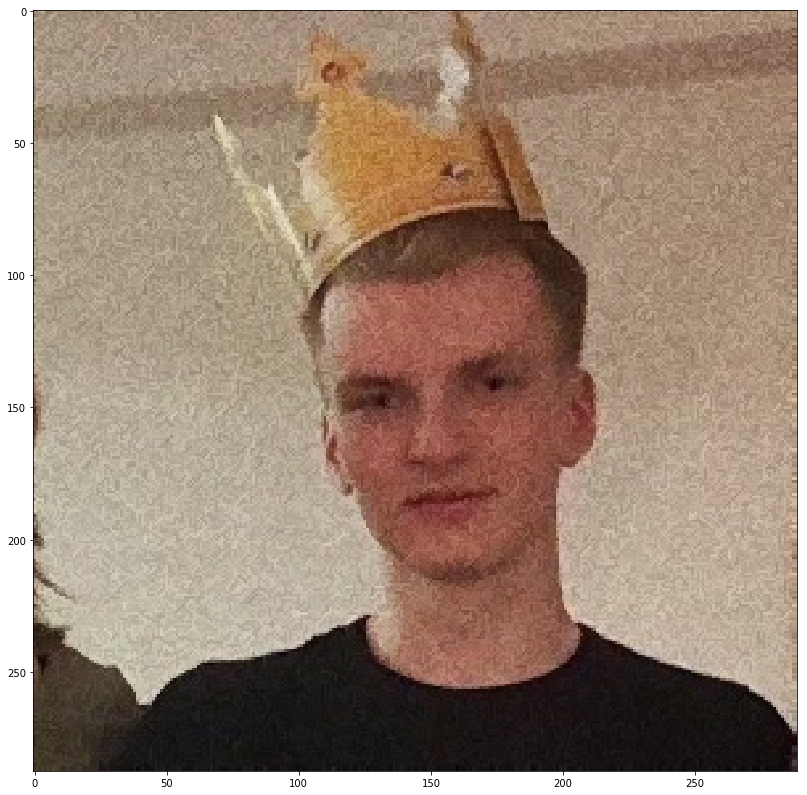

In [146]:
"""Снимаем рамки, получаем итоговый результат."""

av_5_3 = av_5_3_lim[1:289, 1:299, 0:3]

plt.figure(figsize=(21, 14))
plt.imshow(av_5_3);

**Денойзинг Насти**

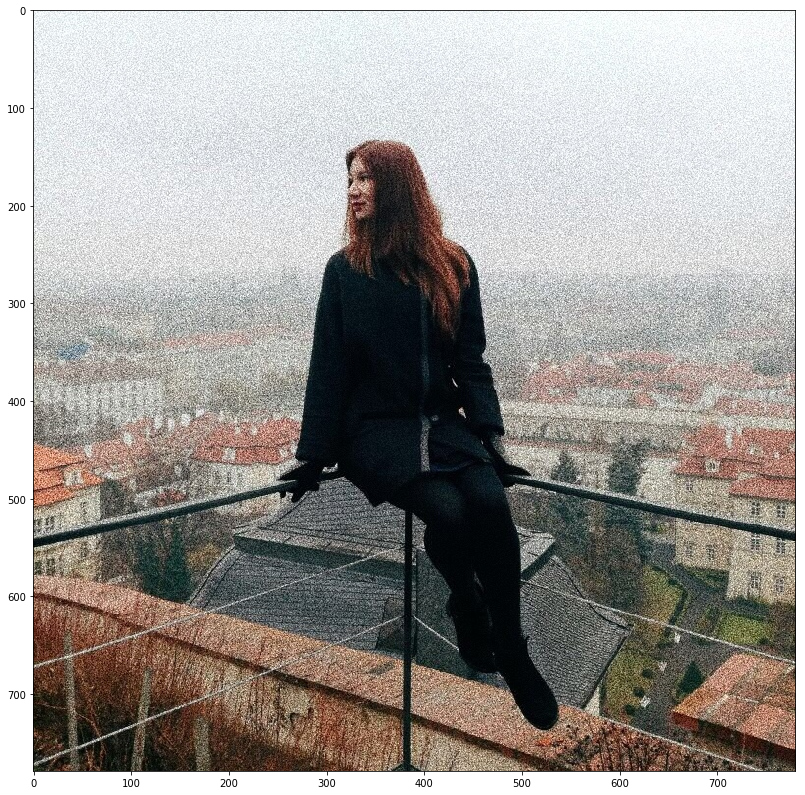

In [118]:
image = plt.imread('../Nastya.jpg')

plt.figure(figsize=(21, 14))
plt.imshow(image);

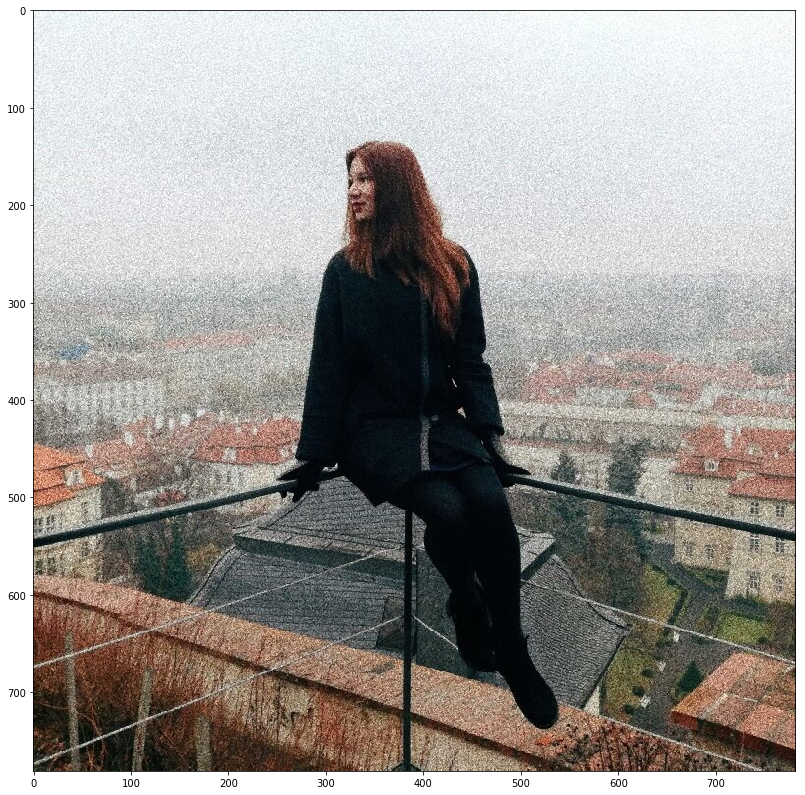

In [119]:
"""Сначала добавляем рамку для более качественной фильтрации и используем
медиану по направлениям для фильтра 3 на 3."""

av_3_lim = run(lim(image), top_av_3, 3, 0, 3)

plt.figure(figsize=(21, 14))
plt.imshow(av_3_lim);

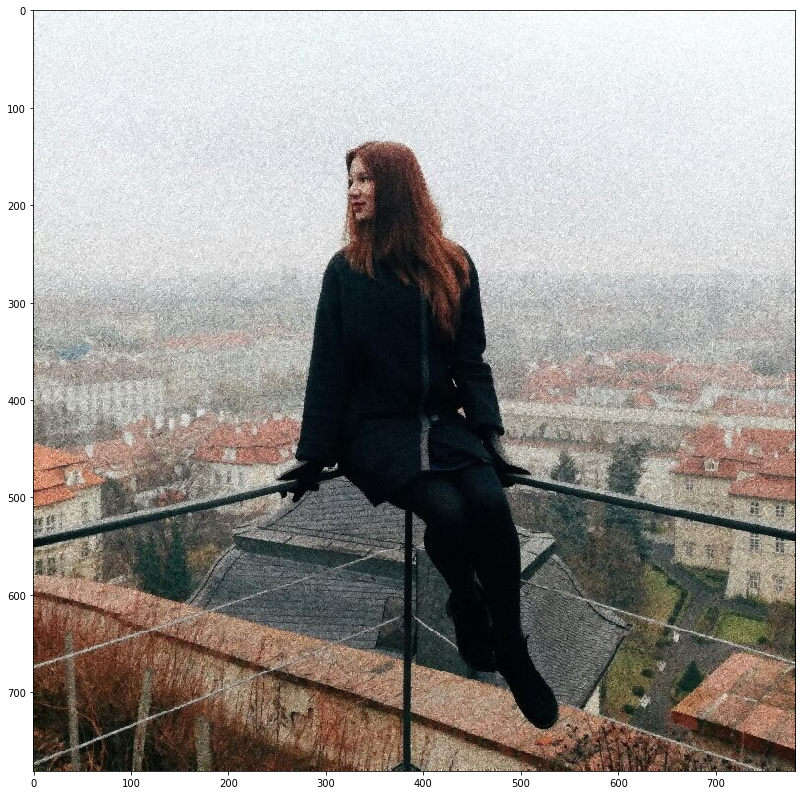

In [120]:
"""Далее используем медиану по направлениям для фильтра 5 на 5."""

av_5_3_lim = run(av_3_lim, top_av_5, 5, 0, 3)

plt.figure(figsize=(21, 14))
plt.imshow(av_5_3_lim);

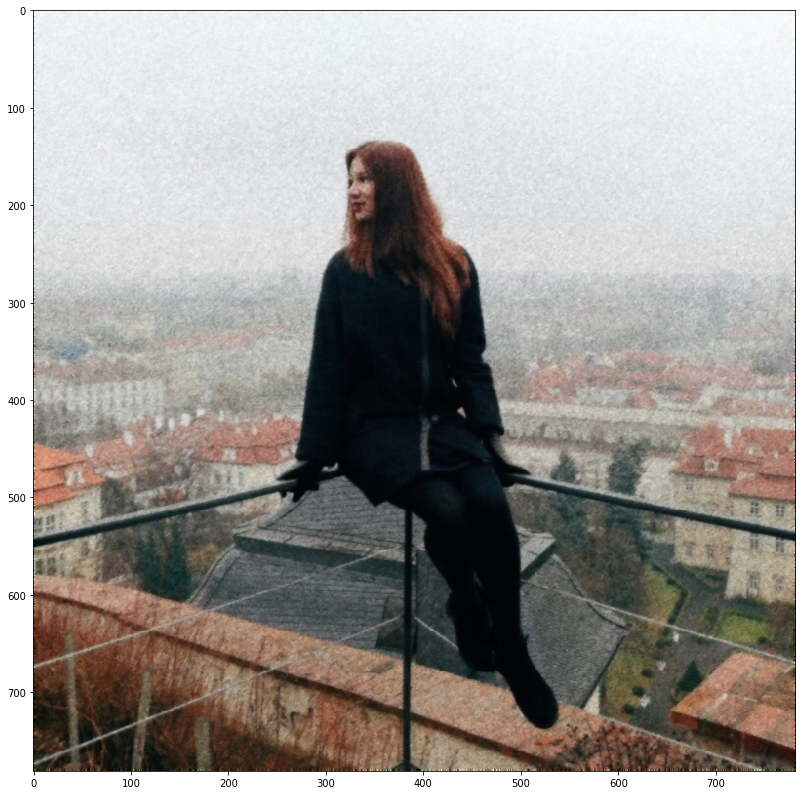

In [121]:
"""Далее сглаживаем картинку через vave."""

vave_av_5_3_lim = run(av_5_3_lim, vave, 5, 0, 3)

plt.figure(figsize=(21, 14))
plt.imshow(vave_av_5_3_lim);

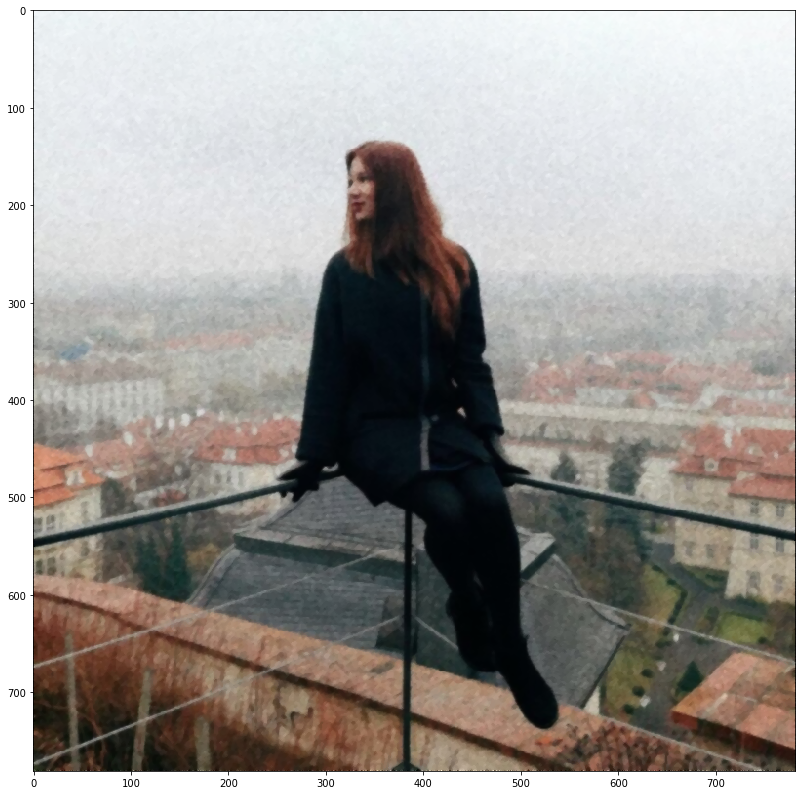

In [122]:
"""Далее используем обычную медиану."""

sort_vave_av_5_3_lim = run(vave_av_5_3_lim, top_sort_3, 3, 0, 3)

plt.figure(figsize=(21, 14))
plt.imshow(sort_vave_av_5_3_lim);

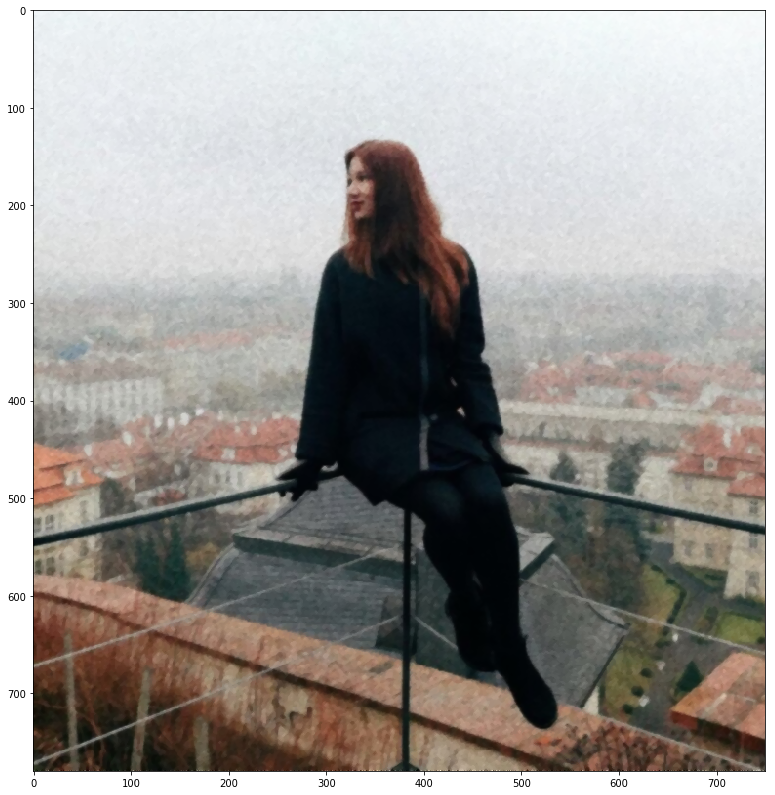

In [136]:
"""Снимаем рамки, получаем итоговый результат."""

sort_vave_av_5_3 = sort_vave_av_5_3_lim[1:1001, 1:751, 0:3]

plt.figure(figsize=(21, 14))
plt.imshow(sort_vave_av_5_3);